In [1]:
import supereeg as se
import pandas as pd
import numpy as np
import os
import hypertools as hyp
import plot as plot
import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
from nilearn import plotting as ni_plt

In [2]:
fig_dir = '/Users/lucyowen/repos/supereeg_paper/paper_figs/methods'

In [3]:
fig_count = 0

# Redo Method Figures

In [4]:
ave_model = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/ave_mat.mo')
BW001_model = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/BW001.mo')
CH003_model = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/CH003.mo')
TJ021_model = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/TJ021.mo')
UP004_model = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/UP004.mo')

/usr/local/lib/python3.6/site-packages/supereeg/helpers.py:909: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  X = X.as_matrix()


In [5]:
bo = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/UP004_sub.bo')
mo = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/UP004.mo')
electrode = 46
lower_bound=5
upper_bound=10
e = bo.get_locs().iloc[electrode]

/usr/local/lib/python3.6/site-packages/supereeg/helpers.py:909: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  X = X.as_matrix()


In [6]:
ave_mat = ave_model.get_model(z_transform=False) 

In [7]:
cluster_labels = hyp.cluster(ave_mat, n_clusters=7)

In [8]:
resorted_labels = []
resorted_factor = []
for c in np.arange(7):
    resorted_labels.append([i for i,x in enumerate(cluster_labels) if x == c])
    resorted_factor.append([x for i,x in enumerate(cluster_labels) if x == c])
resorted_inds = np.concatenate(resorted_labels)
resorted_color = np.concatenate(resorted_factor)

In [9]:
resorted_ave_mat = ave_mat[:, resorted_inds][resorted_inds, :]

In [10]:
factor_list = [0]
total = 0
for r in resorted_factor:
    temp_r = len(r)
    total += temp_r
    factor_list.append(total)

In [11]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=6)
c_list = []
for c in np.arange(7):
    c_list.append(list(cm.viridis(norm(c))))

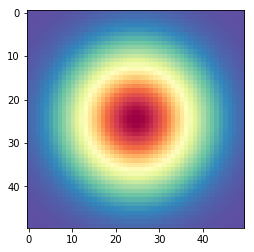

In [12]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plt.imshow(plot.gkern(50), interpolation='none', cmap='Spectral_r')
plt.savefig(outfile)

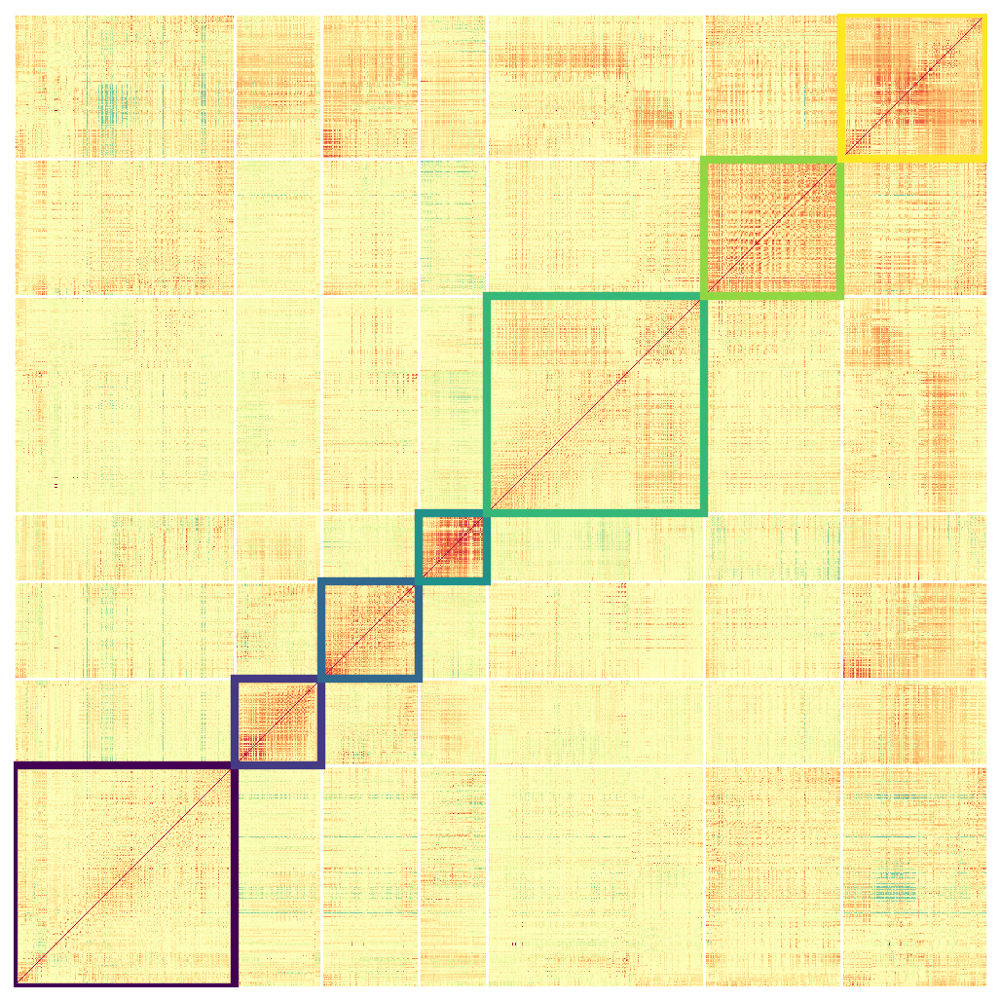

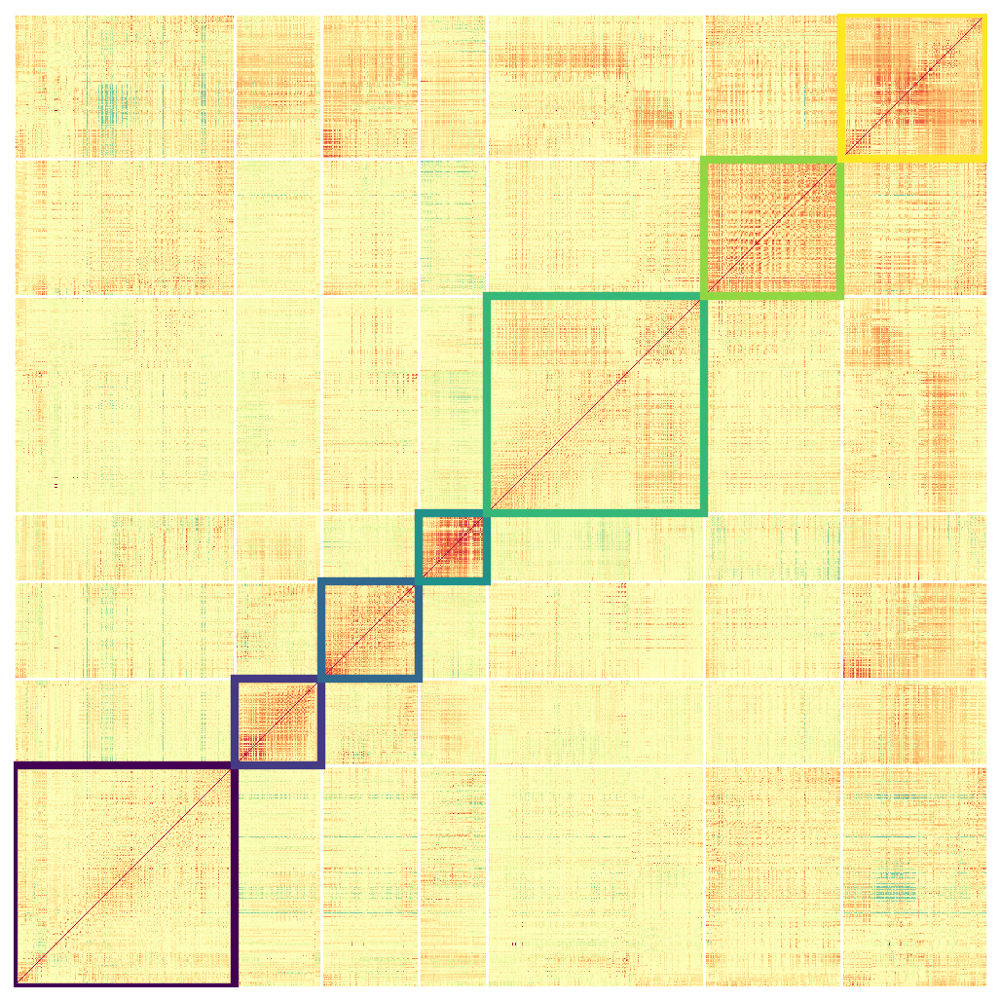

In [13]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
plot._plot_borderless_clustered(resorted_ave_mat, factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)


In [14]:
R = ave_model.get_locs().values
R_resorted = R[resorted_inds]

In [15]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=6)

In [16]:
R_bo = se.helpers.get_rows(R_resorted, bo.get_locs().values)

In [17]:
c_list = []
for c in np.arange(7):
    c_list.append(list(cm.viridis(norm(c))))

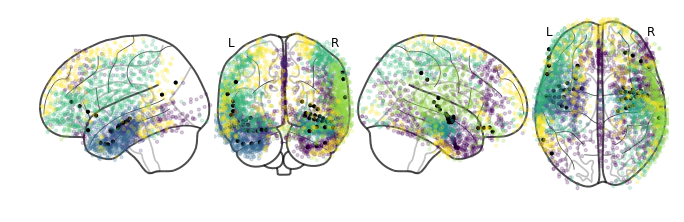

In [18]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')

label = []
sub_list = []
for c in np.arange(7):
    for i, v in enumerate(resorted_color):
        if v == c:
            color_val = list(cm.viridis(norm(c)))
            color_val[3] = .2
            label.append(color_val)
            
            

colors = np.asarray(label)
R_bo = se.helpers.get_rows(R_resorted, bo.get_locs().values)
R_e = se.helpers.get_rows(R_resorted, e.values)
colors[R_e[0]] = np.array([1,0,0,1])
colors[R_bo] = np.array([0,0,0,1])
colors = list(map(lambda x: x[0], np.array_split(colors, colors.shape[0], axis=0)))


ni_plt.plot_connectome(np.eye(R_resorted.shape[0]), R_resorted,
                       node_kwargs={'edgecolors': None}, display_mode='lyrz',
                       node_size=10, node_color=colors)
plt.savefig(outfile)

In [19]:
list(cm.viridis(norm(c)))[3] = .2

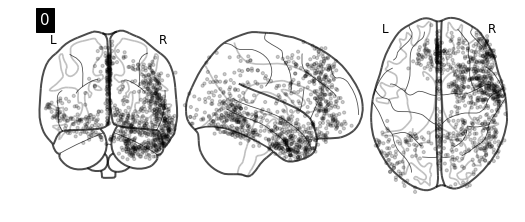

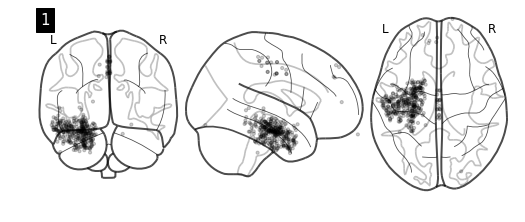

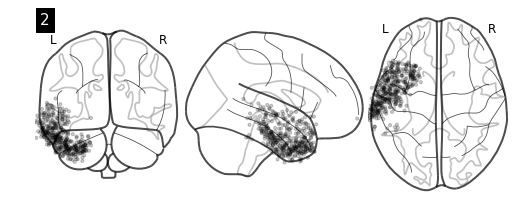

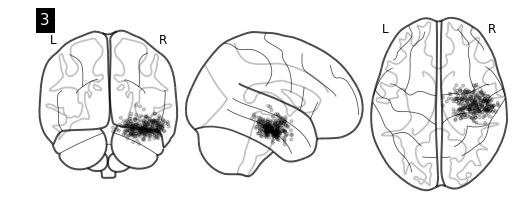

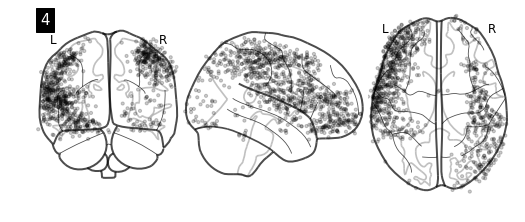

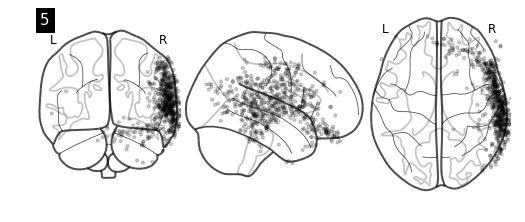

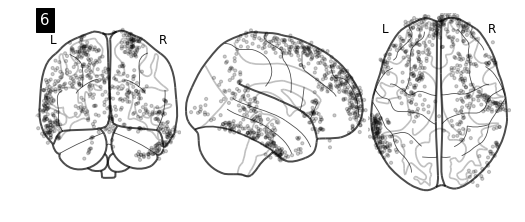

In [20]:

for c in np.arange(7):
    label = []
    sub_list = []
    for i, v in enumerate(resorted_color):
        if v == c:
            sub_list.append(R_resorted[i])
            label.append([0, 0, 0])
    colors = np.asarray(label)
    R_sub = np.asarray(sub_list)
    colors = list(map(lambda x: x[0], np.array_split(colors, colors.shape[0], axis=0)))
    #print(colors)
    outfile = os.path.join(fig_dir, 'factor_' + str(c) + '.png')
    ni_plt.plot_connectome(np.eye(R_sub.shape[0]), R_sub, title=str(c),
                           node_kwargs={'alpha': 0.2, 'edgecolors': None},
                           node_size=10, node_color=colors)
    plt.savefig(outfile)

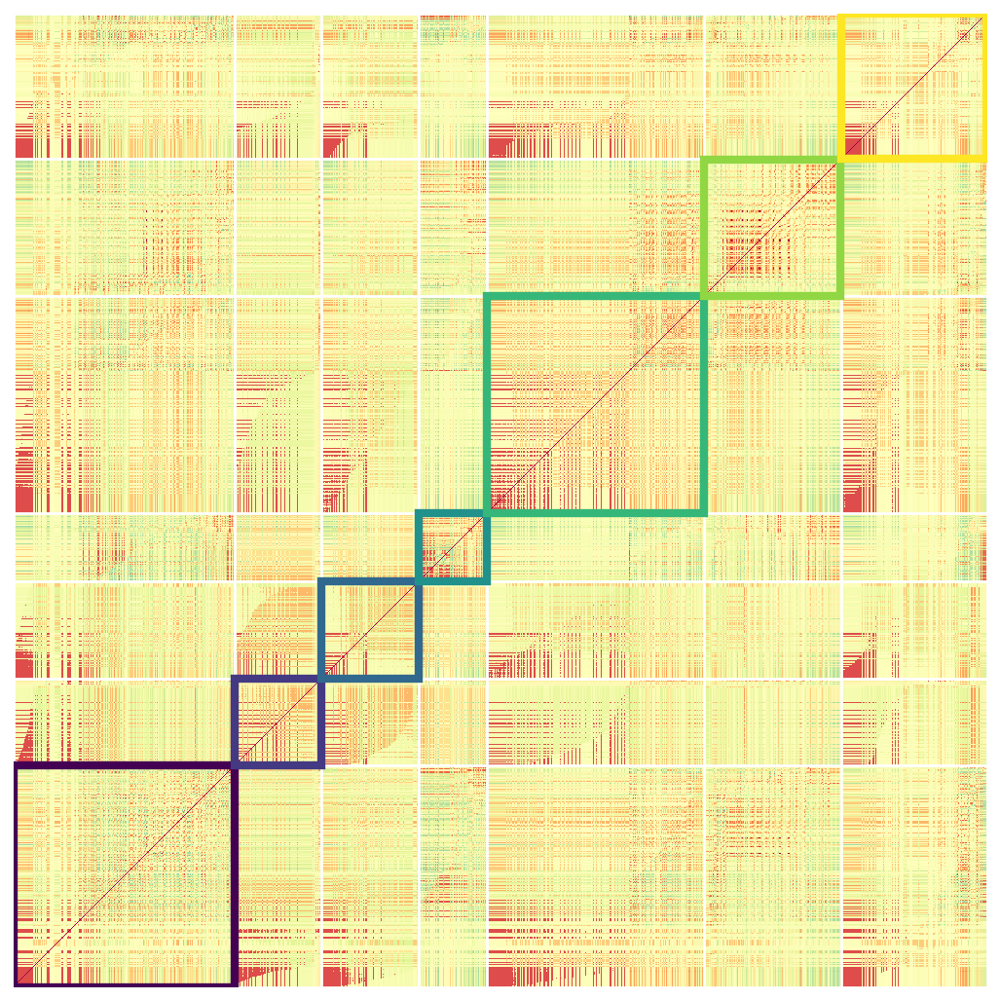

In [21]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
BW001_mat = BW001_model.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(BW001_mat[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

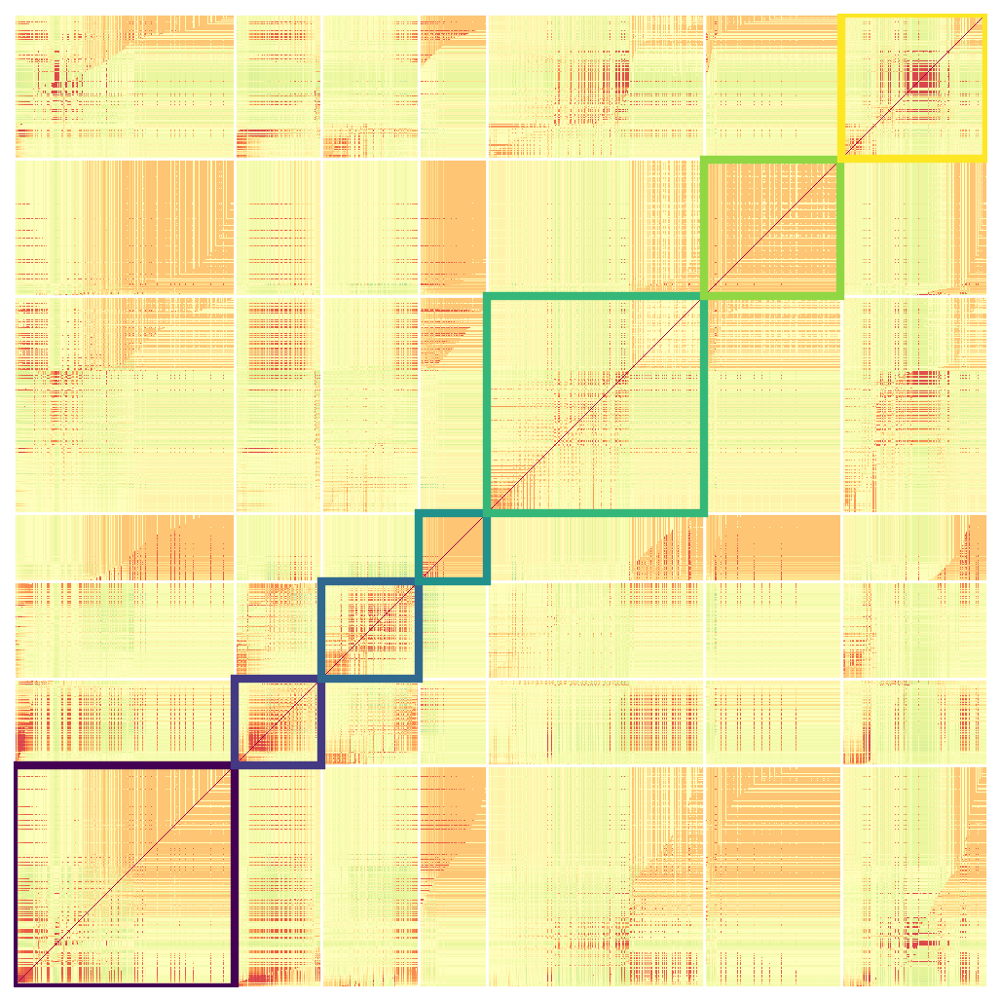

In [22]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
CH003_mat = CH003_model.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(CH003_mat[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

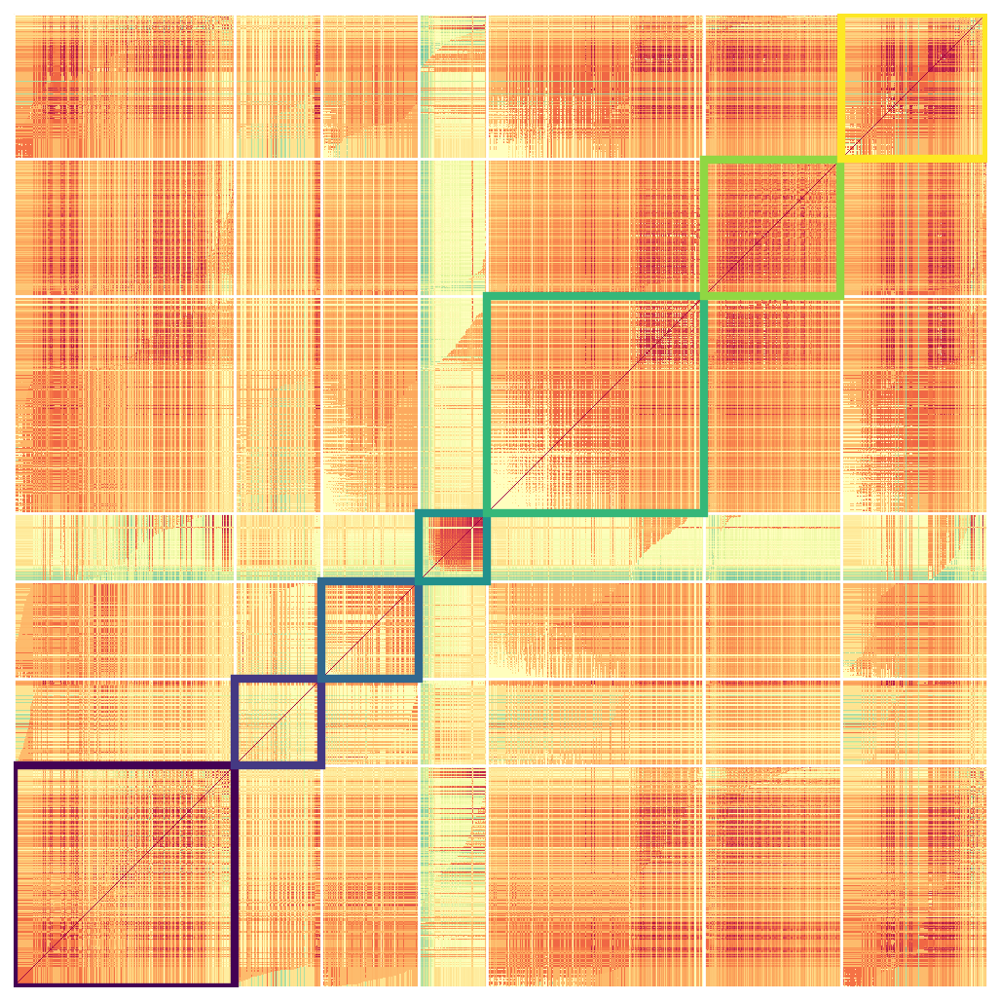

In [23]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
TJ021_mat = TJ021_model.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(TJ021_mat[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

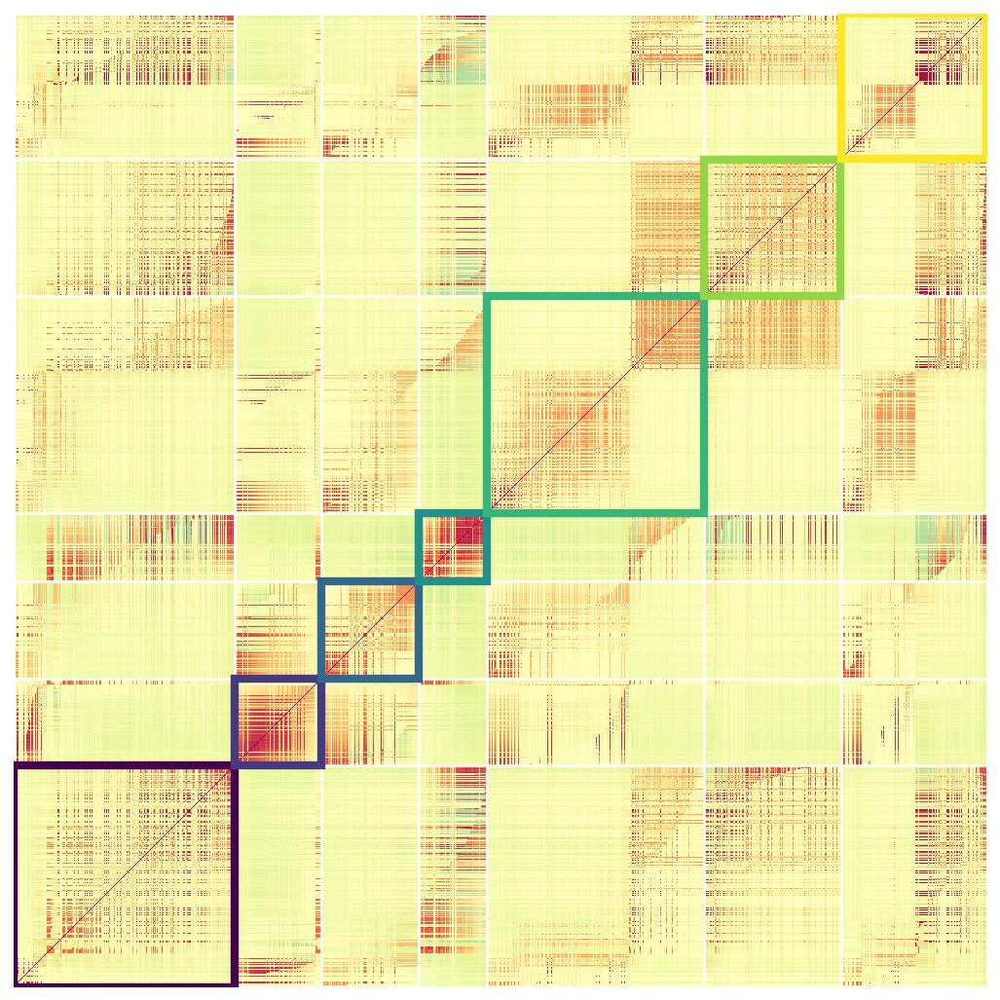

In [24]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
UP004_mat = UP004_model.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(UP004_mat[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

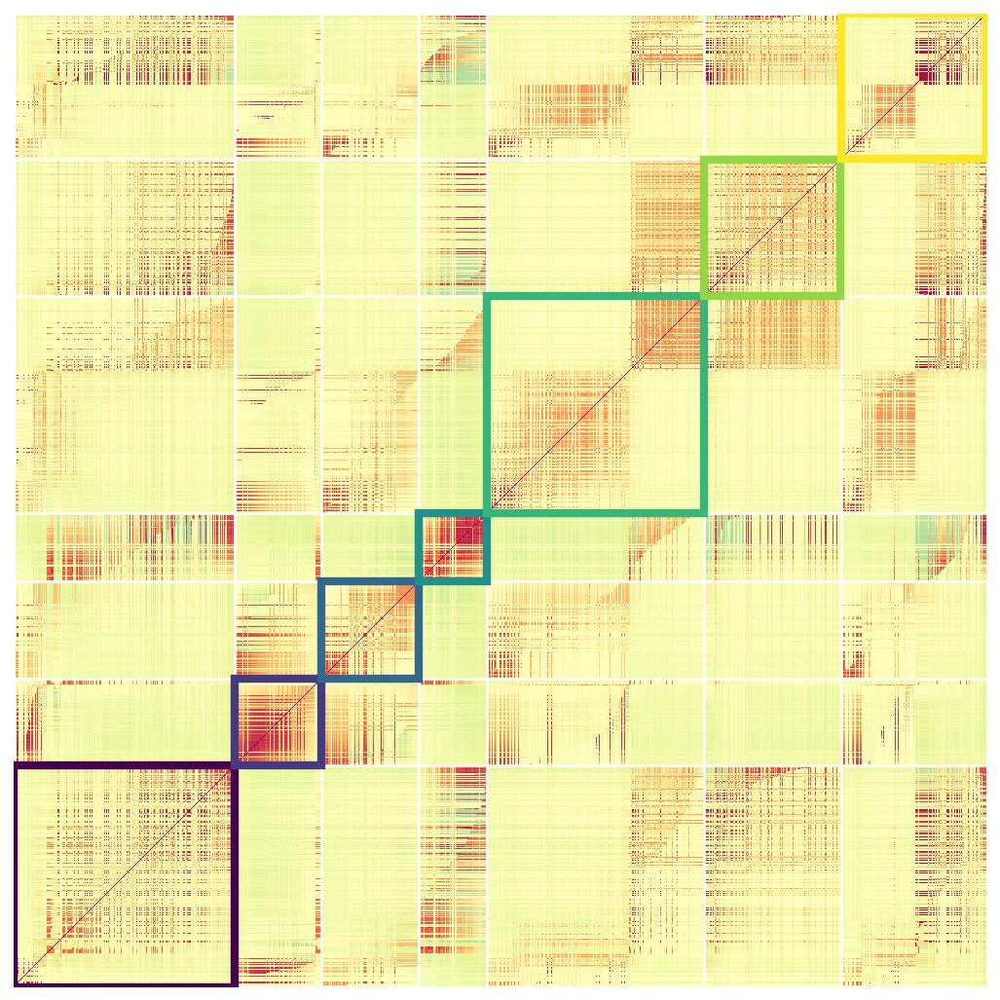

In [25]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '_grouped.png')
ax = plot._plot_borderless_clustered(UP004_mat[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

## Reconstruct UP004 timeseries 

In [26]:
mo_s = ave_model - mo

R = mo.get_locs().as_matrix()

e = bo.get_locs().iloc[electrode]
R_K_subj = bo.get_locs().as_matrix()
R_K_removed, other_inds = se.helpers.remove_electrode(R_K_subj, R_K_subj, electrode)
known_inds, unknown_inds, e_ind = se.helpers.known_unknown(R, R_K_removed, R_K_subj, electrode)

bo.apply_filter()
actual = bo[:,electrode]
bo = bo[:, other_inds]
bo_r = ave_model.predict(bo, recon_loc_inds=e_ind)
c = se.helpers._corr_column(bo_r.data.as_matrix(), actual.get_zscore_data())
print(c)

[0.8947728]


In [27]:
time_data = pd.DataFrame()
time_data['time'] = np.arange(np.shape(actual.get_data())[0])/actual.sample_rate[0]
time_data['actual'] = actual.get_zscore_data()
time_data['predicted'] = bo_r.get_data().values

## Actual vs predicted

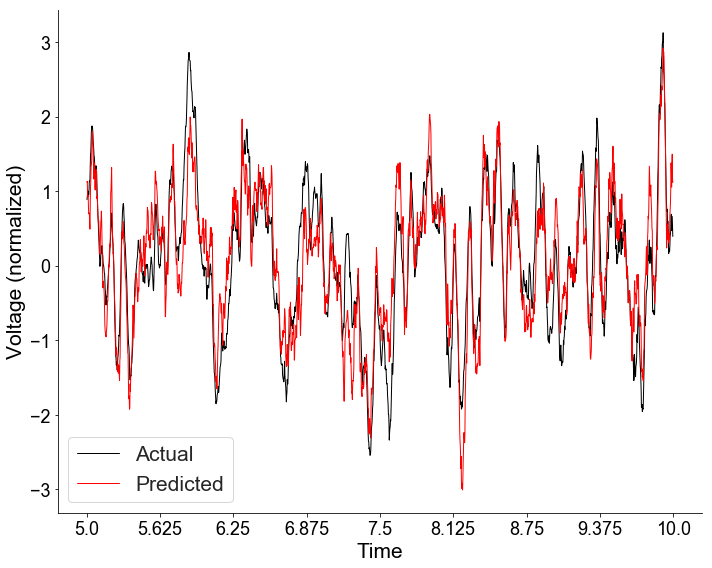

<Figure size 432x288 with 0 Axes>

In [28]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plot.plot_times_series(time_data, lower_bound=lower_bound, upper_bound=upper_bound, outfile=outfile)
plt.show()
plt.clf()

## Normed electrode activity

<Figure size 1332x756 with 0 Axes>

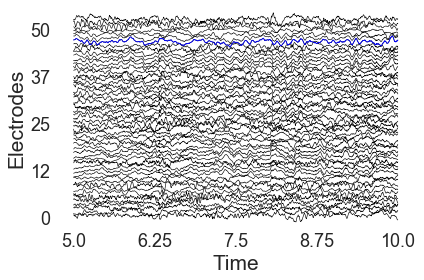

In [29]:
plt.clf()
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plot.plot_Y_electrode(time_data= time_data, bo=bo, lower_bound=lower_bound, upper_bound=upper_bound, electrode=electrode, outfile=outfile)


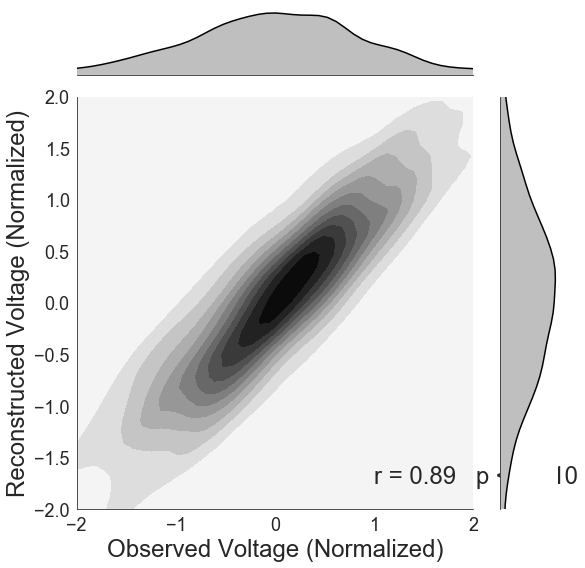

In [30]:
### this actually needs to be computed in full on the cluster

fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
sns.set_style("white")
#g, ax = plt.subplots()
g = (sns.jointplot(x = actual.get_zscore_data(), y=bo_r.data.as_matrix(), kind="kde", color='k', xlim = (-2,2), ylim = (-2,2), height=8).set_axis_labels('Observed Voltage (Normalized)', 'Reconstructed Voltage (Normalized)', fontsize=24))
ax = g.ax_joint
left, width = .75, .5
bottom, height = .05, .5
rstat = stats.pearsonr(bo_r.get_data().as_matrix(), actual.get_zscore_data())
# ax = plt.gca()
# ax.set_ylabel('Reconstructed Voltage (Normalized)', fontsize=24)
# ax.set_xlabel('Observed Voltage (Normalized)', fontsize=24)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.text(left, bottom, 'r = ' + str(np.round(rstat[0][0],2))+ '   p < '+ str(10**-10),
        horizontalalignment='left',
        verticalalignment='bottom',
        transform=ax.transAxes, fontsize=24)
    
plt.tight_layout()

plt.savefig(outfile)


